In [1]:
import os
import numpy as np
from matplotlib import pyplot as plt

In [2]:
def elu(x, alpha=1.0):
    if x > 0:
        return x
    else:
        return alpha * (np.exp(x) - 1)


def binary_step(x):
    if x > 0:
        return 1
    else:
        return 0


def sigmoid(x):
    return 1 / (1 + np.exp(-x))


def linear(x):
    return x


def relu(x):
    return np.maximum(0, x)


def tanh(x):
    return np.tanh(x)


def leaky_relu(x, alpha=0.2):
    if x > 0:
        return x
    else:
        return alpha * x


def parametric_relu(x, alpha=0.2):
    if x > 0:
        return x
    else:
        return alpha * x


def softmax(x):
    return 1 / (1 + np.exp(-x))


def swish(x):
    return x * sigmoid(x)


def gelu(x):
    return 0.5 * x * (1 + tanh(np.sqrt(2 / np.pi) * (x + 0.044715 * np.power(x, 3))))


def selu(x):
    return 1.0507 * elu(x, 1.67326)


def elu_diff(x, alpha=1.0):
    if x > 0:
        return 1
    else:
        return alpha * np.exp(x)


def binary_step_diff(x):
    if x == 0:
        return 1000
    else:
        return 0


def sigmoid_diff(x):
    return sigmoid(x) * (1 - sigmoid(x))


def linear_diff(x):
    return 1


def relu_diff(x):
    if x > 0:
        return 1
    else:
        return 0


def tanh_diff(x):
    return 1 - np.power(tanh(x), 2)


def leaky_relu_diff(x, alpha=0.2):
    if x > 0:
        return 1
    else:
        return alpha


def parametric_relu_diff(x, alpha=0.2):
    if x > 0:
        return 1
    else:
        return alpha


def softmax_diff(x):
    return softmax(x) * (1 - softmax(x))


def swish_diff(x):
    return sigmoid(x) + x * sigmoid_diff(x)


def gelu_diff(x):
    return 0.5 * (1 + tanh(np.sqrt(2 / np.pi) * (x + 0.044715 * np.power(x, 3)))) + \
        0.5 * x * np.sqrt(2 / np.pi) * (1 + 3 * 0.044715 * np.power(x, 2)) * \
        (1 - np.power(tanh(np.sqrt(2 / np.pi) * (x + 0.044715 * np.power(x, 3))), 2))


def selu_diff(x):
    return 1.0507 * elu_diff(x, 1.67326)


elu = np.vectorize(elu)
binary_step = np.vectorize(binary_step)
sigmoid = np.vectorize(sigmoid)
linear = np.vectorize(linear)
relu = np.vectorize(relu)
tanh = np.vectorize(tanh)
leaky_relu = np.vectorize(leaky_relu)
parametric_relu = np.vectorize(parametric_relu)
softmax = np.vectorize(softmax)
swish = np.vectorize(swish)
gelu = np.vectorize(gelu)
selu = np.vectorize(selu)

elu_diff = np.vectorize(elu_diff)
binary_step_diff = np.vectorize(binary_step_diff)
sigmoid_diff = np.vectorize(sigmoid_diff)
linear_diff = np.vectorize(linear_diff)
relu_diff = np.vectorize(relu_diff)
tanh_diff = np.vectorize(tanh_diff)
leaky_relu_diff = np.vectorize(leaky_relu_diff)
parametric_relu_diff = np.vectorize(parametric_relu_diff)
softmax_diff = np.vectorize(softmax_diff)
swish_diff = np.vectorize(swish_diff)
gelu_diff = np.vectorize(gelu_diff)
selu_diff = np.vectorize(selu_diff)

functions = {
    'ELU': {
        'function': elu,
        'range': (-5, 5),
        'function_diff': elu_diff
    },
    'Binary Step': {
        'function': binary_step,
        'range': (-2, 2),
        'function_diff': binary_step_diff,
        'y_range': (-0.05, 1.05),
    },
    'Sigmoid': {
        'function': sigmoid,
        'range': (-6, 6),
        'function_diff': sigmoid_diff
    },
    'Linear': {
        'function': linear,
        'range': (-5, 5),
        'function_diff': linear_diff
    },
    'ReLU': {
        'function': relu,
        'range': (-5, 5),
        'function_diff': relu_diff
    },
    'Tanh': {
        'function': tanh,
        'range': (-3, 3),
        'function_diff': tanh_diff
    },
    'Leaky ReLU': {
        'function': leaky_relu,
        'range': (-5, 5),
        'function_diff': leaky_relu_diff
    },
    'Parametric ReLU': {
        'function': parametric_relu,
        'range': (-5, 5),
        'function_diff': parametric_relu_diff
    },
    'Softmax': {
        'function': softmax,
        'range': (-6, 6),
        'function_diff': softmax_diff
    },
    'Swish': {
        'function': swish,
        'range': (-5, 5),
        'function_diff': swish_diff
    },
    'GELU': {
        'function': gelu,
        'range': (-5, 5),
        'function_diff': gelu_diff
    },
    'SELU': {
        'function': selu,
        'range': (-5, 5),
        'function_diff': selu_diff
    },
}


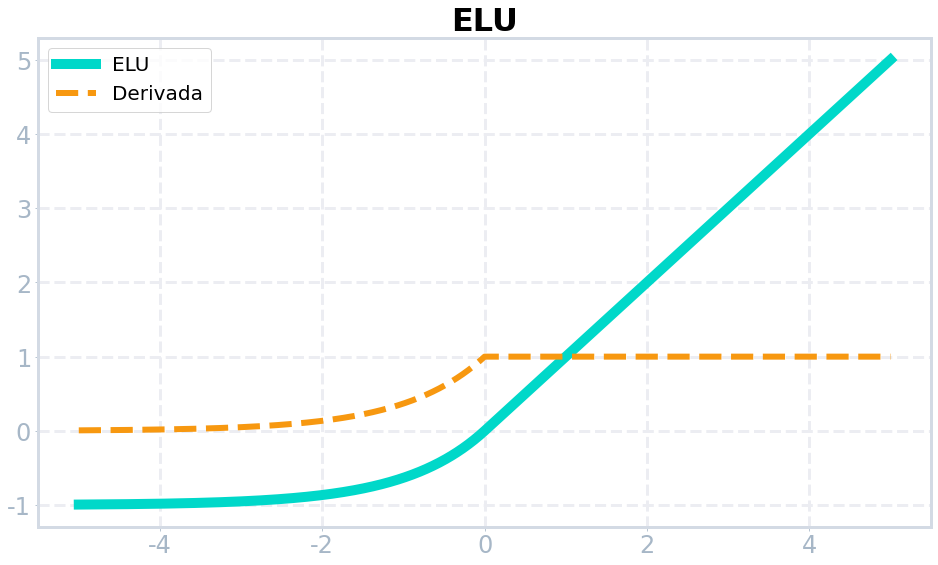

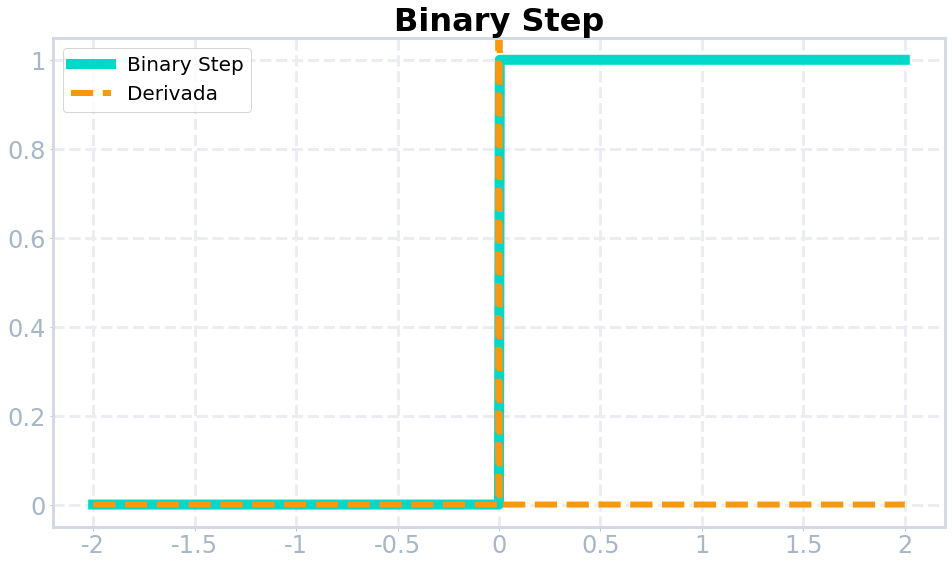

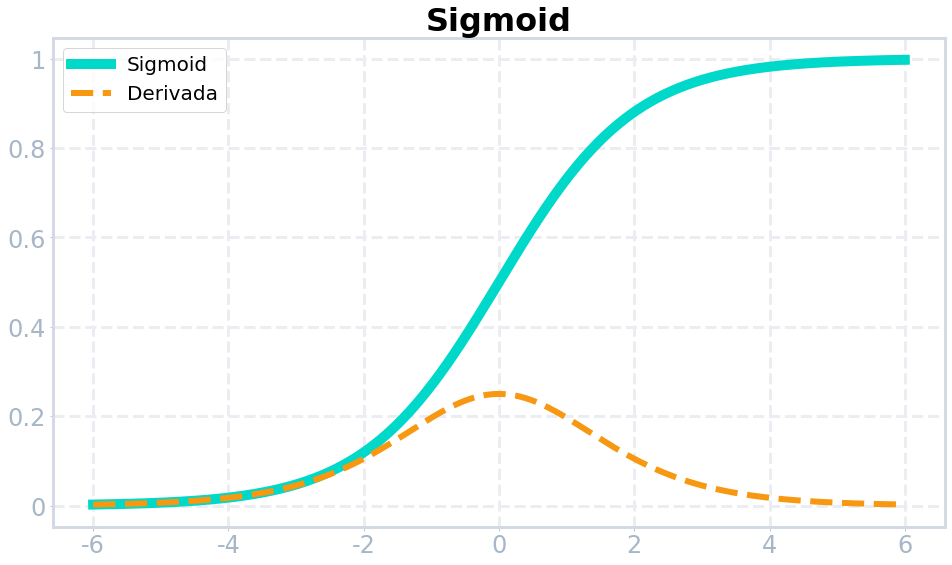

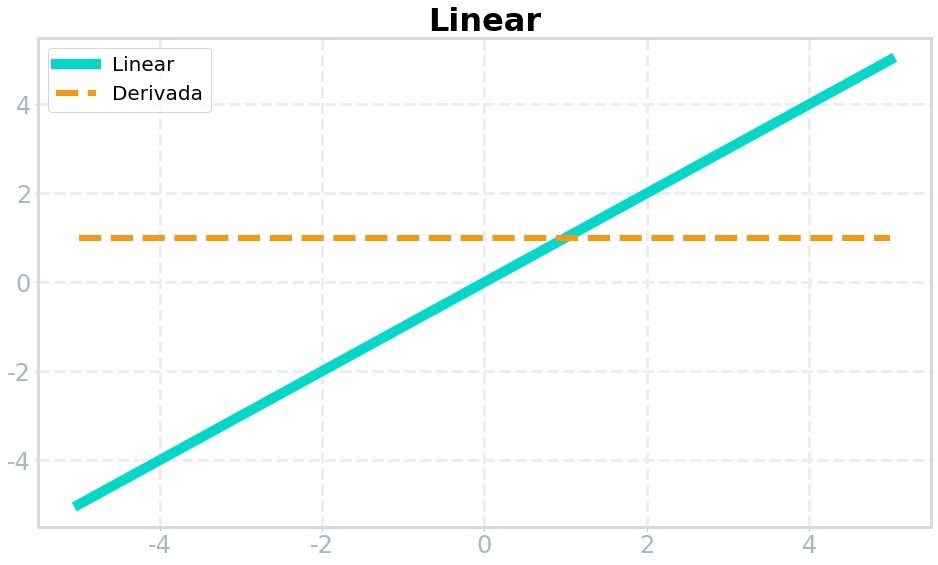

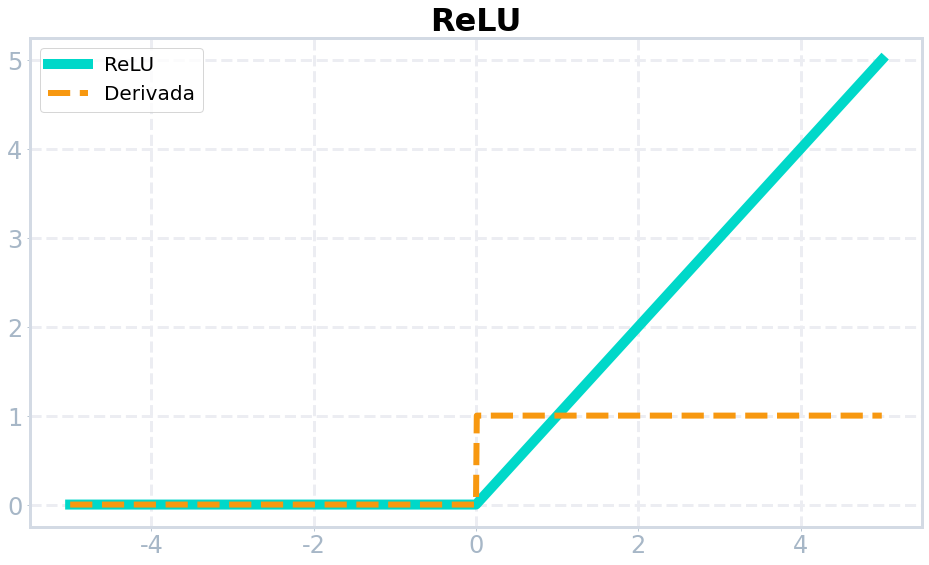

...

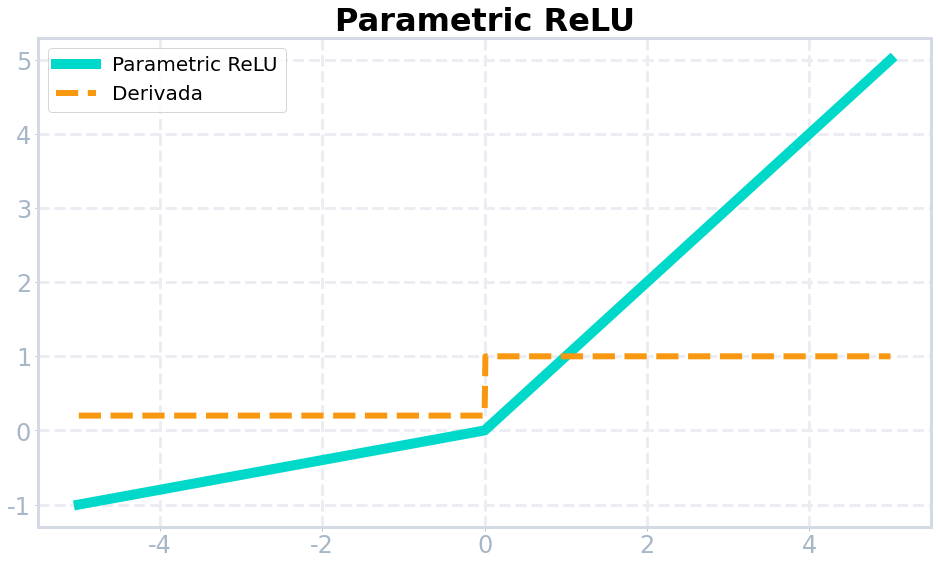

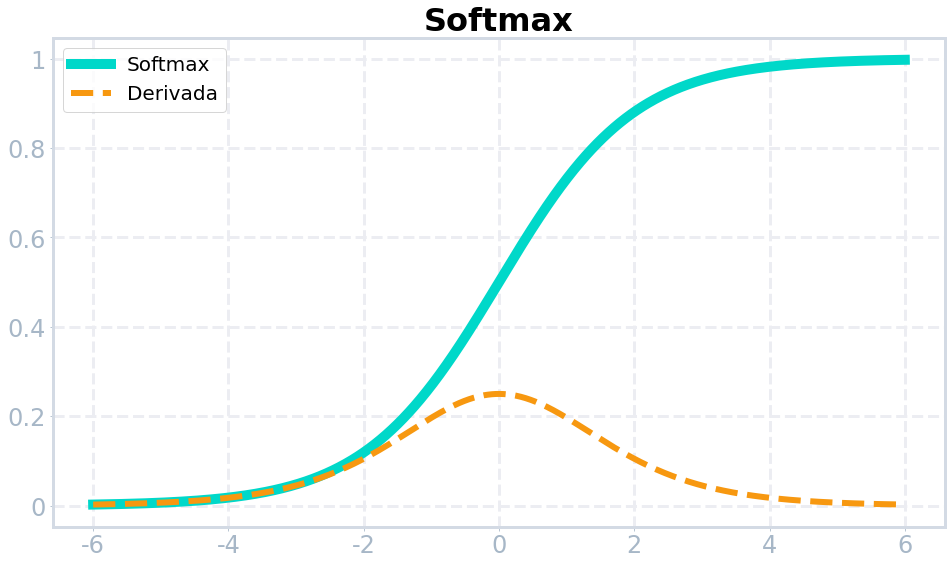

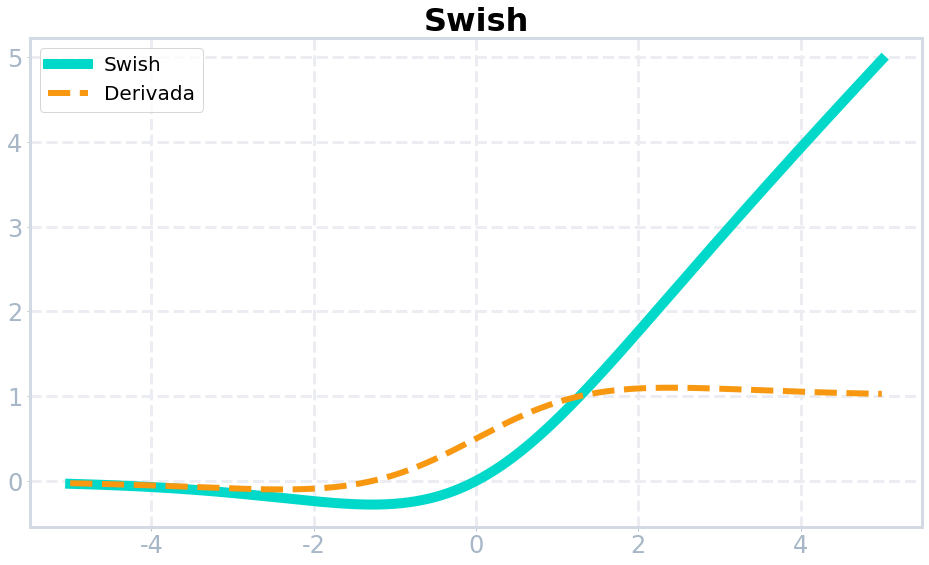

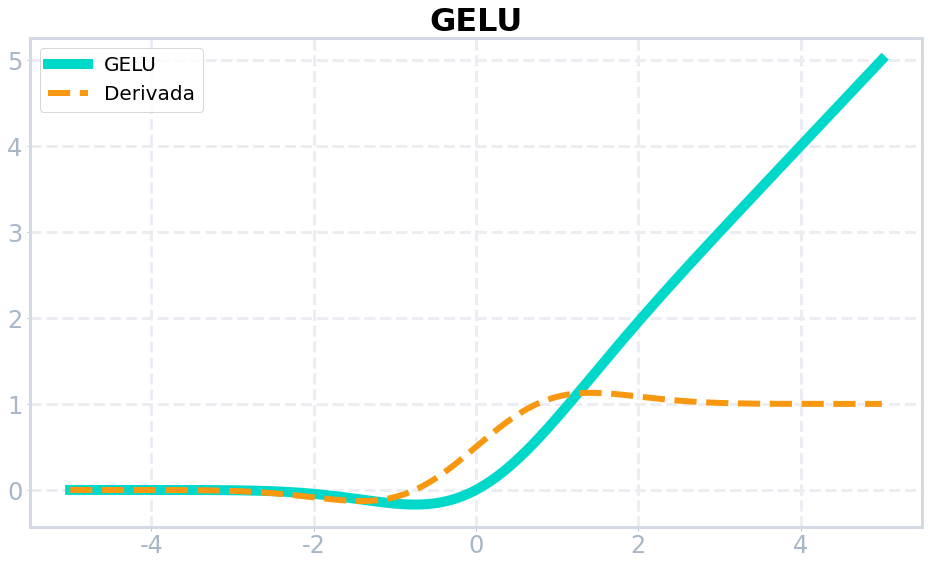

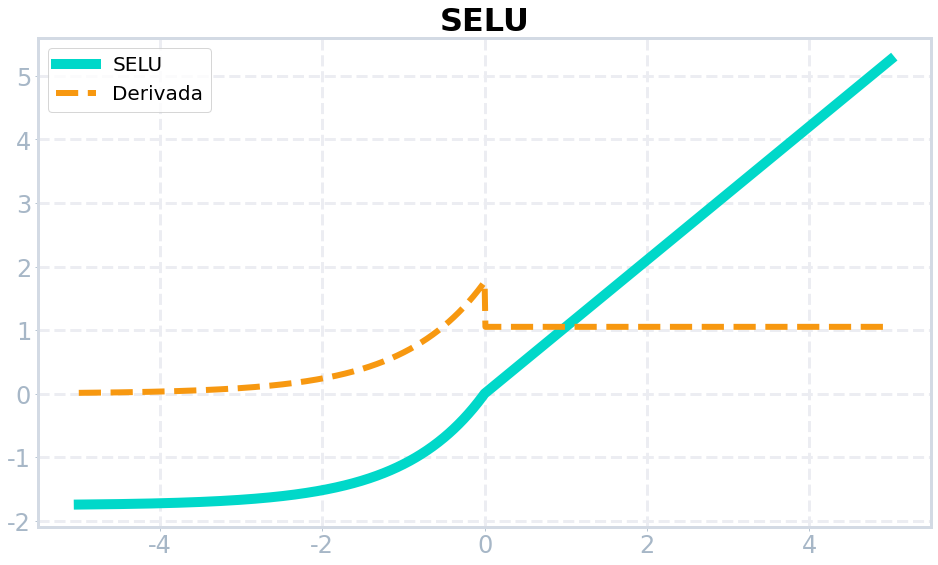

In [3]:
def plot_function(function, function_diff, x_range=(-10, 10), y_range=None, title=None):
    x = np.linspace(x_range[0], x_range[1], 1001)
    y = function(x)
    y_diff = function_diff(x)
    plt.figure(figsize=(16, 9))
    plt.plot(x, y, color='#00d8c9', linewidth=10)
    plt.plot(x, y_diff, color='#f79810', linewidth=6, linestyle='--')
    plt.legend([title, 'Derivada'], fontsize=20)
    plt.title(title, fontsize=32, fontweight='bold')
    plt.grid(color='#ecedf2', linestyle='--', linewidth=3)
    if y_range is not None:
        plt.ylim(y_range)
    plt.gca().spines['bottom'].set_color('#d3dae4')
    plt.gca().spines['top'].set_color('#d3dae4')
    plt.gca().spines['right'].set_color('#d3dae4')
    plt.gca().spines['left'].set_color('#d3dae4')
    plt.gca().spines['bottom'].set_linewidth(3)
    plt.gca().spines['top'].set_linewidth(3)
    plt.gca().spines['right'].set_linewidth(3)
    plt.gca().spines['left'].set_linewidth(3)
    plt.tick_params(axis='x', colors='#a7b7c7')
    plt.tick_params(axis='y', colors='#a7b7c7')
    plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(lambda x, loc: f'{x:.2g}'))
    plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda y, loc: f'{y:.2g}'))
    plt.gca().tick_params(axis='both', which='major', labelsize=24)
    plt.gca().tick_params(axis='both', which='minor', labelsize=24)
    plt.savefig(f'./jupyter_notebooks/activation_functions/img/{title}.jpg', dpi=300, bbox_inches='tight', pad_inches=1)
    plt.show()


def create_directory_if_not_exists(directory):
    if not os.path.exists(directory):
        os.makedirs(directory)


directory = './jupyter_notebooks/activation_functions/img'
create_directory_if_not_exists(directory)
for name, value in functions.items():
    plot_function(value['function'], value['function_diff'], x_range=value['range'], y_range=value.get('y_range', None), title=name)

In [4]:
import os
from PIL import Image, ImageDraw

def concatenate_images(folder_path):
    # Get a list of all image files in the folder
    image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg')]
    
    # Open the first image to get its size
    first_image = Image.open(os.path.join(folder_path, image_files[0]))
    width, height = first_image.size
    
    # Calculate the number of rows and columns for the grid
    num_images = len(image_files)
    rows = int(num_images ** 0.5)
    cols = int(num_images / rows)
    if num_images % rows != 0:
        cols += 1
    
    # Create a new image with the appropriate size
    final_image = Image.new('RGB', (width * cols, height * rows), (255, 255, 255))
    draw = ImageDraw.Draw(final_image)
    # Paste each image into the final image
    for i, file in enumerate(image_files):
        image = Image.open(os.path.join(folder_path, file))
        x = (i % cols) * width
        y = (i // cols) * height
        final_image.paste(image, (x, y))
    return final_image


final_image = concatenate_images(directory)
final_image.save(f'{directory}/All activation functions.png')

from IPython.display import Image
Image(filename=f'{directory}/All activation functions.png')